In [1]:
!pip install pandas 


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install lazypredict


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.express as px
import lazypredict
from sklearn.utils import shuffle
from lazypredict.Supervised import LazyRegressor

In [4]:
data = pd.read_csv('diamonds.csv')

In [5]:
df = pd.DataFrame(data)

In [6]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.50,55.00,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.80,61.00,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.90,65.00,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.40,58.00,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.30,58.00,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.80,57.00,2757,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.10,55.00,2757,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.80,60.00,2757,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.00,58.00,2757,6.15,6.12,3.74


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [8]:
df.describe()

,carat,depth,table,price,x,y,z
count,53940.00,53940.00,53940.00,53940.00,53940.00,53940.00,53940.00
mean,0.80,61.75,57.46,3932.80,5.73,5.73,3.54
std,0.47,1.43,2.23,3989.44,1.12,1.14,0.71
min,0.20,43.00,43.00,326.00,0.00,0.00,0.00
25%,0.40,61.00,56.00,950.00,4.71,4.72,2.91
50%,0.70,61.80,57.00,2401.00,5.70,5.71,3.53
75%,1.04,62.50,59.00,5324.25,6.54,6.54,4.04
max,5.01,79.00,95.00,18823.00,10.74,58.90,31.80


In [9]:
df.dtypes

carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
dtype: object

In [10]:
df["carat"].unique()

array([0.23, 0.21, 0.29, 0.31, 0.24, 0.26, 0.22, 0.3 , 0.2 , 0.32, 0.33,
       0.25, 0.35, 0.42, 0.28, 0.38, 0.7 , 0.86, 0.71, 0.78, 0.96, 0.73,
       0.8 , 0.75, 0.74, 0.81, 0.59, 0.9 , 0.91, 0.61, 0.77, 0.63, 0.76,
       0.64, 0.72, 0.79, 0.58, 1.17, 0.6 , 0.83, 0.54, 0.98, 0.52, 1.01,
       0.53, 0.84, 0.51, 1.05, 0.55, 0.87, 1.  , 0.57, 0.82, 1.04, 0.93,
       1.2 , 0.99, 0.34, 0.43, 0.36, 0.95, 0.89, 1.02, 0.97, 0.56, 0.85,
       0.92, 1.27, 0.66, 1.12, 0.68, 1.03, 0.62, 1.22, 1.08, 0.88, 0.5 ,
       1.19, 0.39, 0.65, 1.24, 1.5 , 0.27, 0.41, 1.13, 1.06, 0.69, 0.4 ,
       1.14, 0.94, 1.29, 1.52, 1.16, 1.21, 1.23, 1.09, 0.67, 1.11, 1.1 ,
       1.18, 1.15, 1.25, 1.07, 1.28, 1.51, 0.37, 1.31, 1.26, 1.39, 1.44,
       1.35, 1.3 , 1.32, 1.41, 1.36, 1.45, 1.34, 1.58, 1.54, 1.38, 1.33,
       1.74, 1.64, 1.47, 1.4 , 1.55, 1.95, 2.  , 1.37, 1.83, 1.62, 1.57,
       1.69, 2.06, 1.72, 1.66, 2.14, 1.49, 1.46, 2.15, 1.96, 2.22, 1.7 ,
       1.53, 1.85, 2.01, 2.27, 1.68, 1.56, 1.81, 1.

In [11]:
df["price"].unique() 

array([ 326,  327,  334, ..., 2753, 2755, 2756], shape=(11602,))

In [12]:
df['price'] = df['price'] *88


In [13]:
df['price'].value_counts()

price
53240     132
70576     127
55000     126
72864     125
68288     124
         ... 
243672      1
794904      1
794376      1
794288      1
794200      1
Name: count, Length: 11602, dtype: int64

In [14]:
df[['cut','color','clarity']].nunique()

cut        5
color      7
clarity    8
dtype: int64

In [15]:
df[['carat','depth','table','price','x','y','z']].nunique()

carat      273
depth      184
table      127
price    11602
x          554
y          552
z          375
dtype: int64

In [16]:
round((df.isnull().sum() / df.shape[0]) * 100, 2)

carat     0.00
cut       0.00
color     0.00
clarity   0.00
depth     0.00
table     0.00
price     0.00
x         0.00
y         0.00
z         0.00
dtype: float64

In [17]:
df.duplicated().unique()

array([False,  True])

In [18]:
df.duplicated().sum()

np.int64(146)

In [19]:
df1 = df[df.duplicated(keep=False)]
df1 

,carat,cut,color,clarity,depth,table,price,x,y,z
1004,0.79,Ideal,G,SI1,62.30,57.00,255024,5.90,5.85,3.66
1005,0.79,Ideal,G,SI1,62.30,57.00,255024,5.90,5.85,3.66
1006,0.79,Ideal,G,SI1,62.30,57.00,255024,5.90,5.85,3.66
1007,0.79,Ideal,G,SI1,62.30,57.00,255024,5.90,5.85,3.66
1008,0.79,Ideal,G,SI1,62.30,57.00,255024,5.90,5.85,3.66
...,...,...,...,...,...,...,...,...,...,...
49557,0.71,Good,F,SI2,64.10,60.00,187440,0.00,0.00,0.00
50078,0.51,Ideal,F,VVS2,61.20,56.00,193864,5.19,5.17,3.17
50079,0.51,Ideal,F,VVS2,61.20,56.00,193864,5.19,5.17,3.17
52860,0.50,Fair,E,VS2,79.00,73.00,226952,5.21,5.18,4.09


In [20]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.50,55.00,28688,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.80,61.00,28688,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.90,65.00,28776,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.40,58.00,29392,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.30,58.00,29480,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.80,57.00,242616,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.10,55.00,242616,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.80,60.00,242616,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.00,58.00,242616,6.15,6.12,3.74


In [21]:
df['table'].unique().sum()

np.float64(7475.4)

In [22]:
df['clarity'].unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [23]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [24]:
df['table'].unique()

array([55. , 61. , 65. , 58. , 57. , 56. , 54. , 62. , 59. , 63. , 60. ,
       55.3, 69. , 53. , 64. , 56.4, 60.5, 67. , 52. , 55.8, 66. , 70. ,
       68. , 54.4, 57.1, 53.6, 54.8, 54.2, 54.9, 56.7, 53.9, 57.8, 54.1,
       55.1, 51. , 58.1, 56.9, 56.5, 53.7, 60.7, 56.2, 56.6, 56.1, 56.3,
       57.2, 57.5, 60.9, 59.8, 62.3, 60.1, 55.9, 50.1, 62.2, 54.5, 55.7,
       53.4, 54.7, 58.8, 59.4, 62.5, 54.3, 60.6, 55.2, 58.6, 49. , 50. ,
       54.6, 62.6, 57.7, 56.8, 57.9, 60.3, 55.6, 59.5, 57.4, 62.4, 60.4,
       53.3, 60.2, 60.8, 58.5, 57.6, 43. , 59.9, 63.5, 57.3, 61.4, 58.3,
       55.4, 58.2, 53.5, 59.7, 55.5, 58.7, 53.8, 59.1, 53.2, 59.3, 61.1,
       51.6, 95. , 61.2, 59.2, 58.4, 53.1, 52.8, 44. , 61.3, 61.9, 61.8,
       59.6, 61.5, 58.9, 64.3, 62.8, 71. , 52.4, 63.3, 61.7, 64.2, 73. ,
       65.4, 63.4, 62.1, 79. , 76. , 61.6])

In [25]:
df['depth'].unique()

array([61.5, 59.8, 56.9, 62.4, 63.3, 62.8, 62.3, 61.9, 65.1, 59.4, 64. ,
       60.4, 62.2, 60.2, 60.9, 62. , 63.4, 63.8, 62.7, 61. , 58.1, 62.5,
       60.5, 60. , 60.7, 59.5, 58.2, 64.1, 60.8, 61.8, 61.2, 61.1, 65.2,
       58.4, 63.1, 61.6, 59.3, 62.6, 63. , 63.2, 62.1, 61.4, 62.9, 63.7,
       59.2, 59.9, 57.9, 55.1, 57.5, 66.3, 61.7, 58.8, 64.5, 65.3, 59.6,
       64.4, 65.7, 63.6, 61.3, 60.1, 60.3, 58. , 64.6, 59.7, 57.8, 67.9,
       60.6, 57.2, 64.2, 65.8, 67.4, 59. , 63.5, 67.3, 58.7, 66.4, 68.1,
       63.9, 55. , 58.6, 64.3, 58.5, 65. , 56. , 58.3, 53.1, 64.9, 59.1,
       58.9, 66.7, 57.7, 65.4, 53.3, 53. , 67.8, 66.1, 55.8, 67.6, 68.2,
       65.5, 67.7, 69.5, 56.6, 56.3, 66.9, 66. , 67. , 57.6, 67.1, 65.6,
       64.8, 69.3, 66.2, 55.4, 66.8, 64.7, 66.6, 55.9, 57.3, 57.4, 68.3,
       68.5, 56.2, 65.9, 56.5, 56.1, 66.5, 68.4, 69.7, 57.1, 68.7, 56.7,
       68.6, 71.6, 43. , 68.8, 67.5, 69. , 55.2, 68.9, 69.6, 57. , 56.4,
       56.8, 44. , 67.2, 70.1, 71.3, 70.6, 69.8, 71

In [26]:
df['cut'].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [27]:
df['color'].unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [28]:
df['x'].unique()

array([ 3.95,  3.89,  4.05,  4.2 ,  4.34,  3.94,  4.07,  3.87,  4.  ,
        4.25,  3.93,  3.88,  4.35,  3.79,  4.38,  4.31,  4.23,  4.21,
        4.26,  3.85,  4.39,  4.44,  3.97,  4.28,  3.96,  4.04,  4.01,
        3.92,  4.06,  3.83,  4.29,  4.13,  4.49,  3.99,  4.19,  4.24,
        4.36,  4.33,  4.02,  4.45,  3.91,  4.3 ,  4.43,  4.54,  4.78,
        4.15,  4.08,  4.03,  4.65,  4.22,  5.7 ,  6.45,  5.68,  5.81,
        5.85,  5.71,  6.27,  5.77,  5.97,  5.8 ,  6.  ,  5.94,  5.87,
        5.9 ,  6.14,  5.38,  5.96,  6.16,  5.73,  5.98,  5.72,  6.01,
        5.64,  5.57,  5.63,  5.65,  6.09,  5.56,  6.11,  6.03,  5.89,
        5.69,  5.62,  5.88,  5.52,  5.74,  5.53,  5.78,  5.83,  5.66,
        5.82,  5.79,  5.92,  5.39,  5.33,  6.83,  5.41,  5.25,  5.24,
        5.67,  5.61,  5.76,  6.05,  5.6 ,  5.19,  5.84,  6.39,  5.34,
        5.14,  5.11,  5.54,  6.07,  6.29,  6.31,  6.49,  5.28,  5.48,
        5.55,  6.41,  6.02,  5.91,  6.17,  6.61,  5.12,  6.19,  5.43,
        5.99,  5.95,

In [29]:
from statsmodels.stats.weightstats import ztest

In [30]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [31]:
z_stat, p_val_z = ztest(x1=df['table'], x2=df['price'], value=0)
print (z_stat)
print(p_val_z)

-228.9144905033252
0.0


In [32]:
import scipy.stats as stats

contingency_table = pd.crosstab(df['price'], df['carat'])

df_value = (contingency_table.shape[0] - 1) * (contingency_table.shape[1] - 1)

alpha = 0.05

critical_value = stats.chi2.ppf(1 - alpha, df_value)

print(f"Contingency Table Shape (Rows x Cols): {contingency_table.shape}")
print(f"Calculated Degrees of Freedom (df): {df_value}")
print(f"Critical Value (Chi-squared at α=0.05): {critical_value:.4f}")

Contingency Table Shape (Rows x Cols): (11602, 273)
Calculated Degrees of Freedom (df): 3155472
Critical Value (Chi-squared at α=0.05): 3159605.2709


In [33]:
alpha = 0.05

# Two-Sample Z-test: Testing if the mean of 'carat' and 'price' are equal.
# The 'value=0' argument tests the null hypothesis that (mean(carat) - mean(price)) = 0.
z_stat, p_val_z = ztest(x1=df['carat'], x2=df['price'], value=0)

decision_z = "Reject" if p_val_z <= alpha else "Fail reject"
concl_z = "Significant difference." if decision_z == "Reject" else "No significant difference."

print("\n--- Two-Sample Z-Test Results ---")
print("Z-statistic:", z_stat)
print("P-value:", p_val_z)
print(f"Decision: {decision_z} H0 at α={alpha}")
print("Conclusion:", concl_z)


--- Two-Sample Z-Test Results ---
Z-statistic: -228.95197327674128
P-value: 0.0
Decision: Reject H0 at α=0.05
Conclusion: Significant difference.


<Axes: >

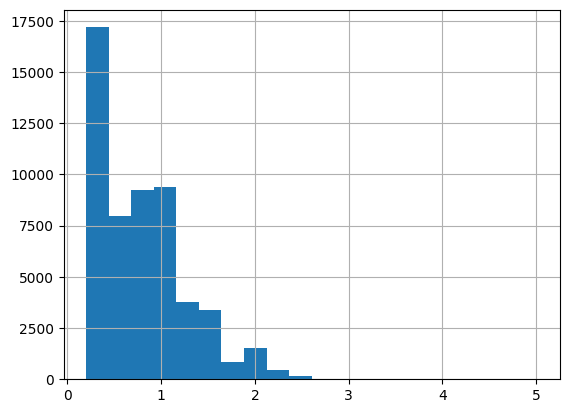

In [34]:
df["carat"].hist(bins=20)

In [35]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [36]:
fig_pairplot = px.scatter_matrix(
    df, 
    # Select the numerical columns you want to include in the matrix
    dimensions=['price','carat', 'table', 'depth'], 
    # Use 'cut' to color the points for better separation of categories
    color='cut',
    title="Pair Plot (Scatter Matrix) of Diamond Attributes by Cut Quality"
) 

fig_pairplot.show()

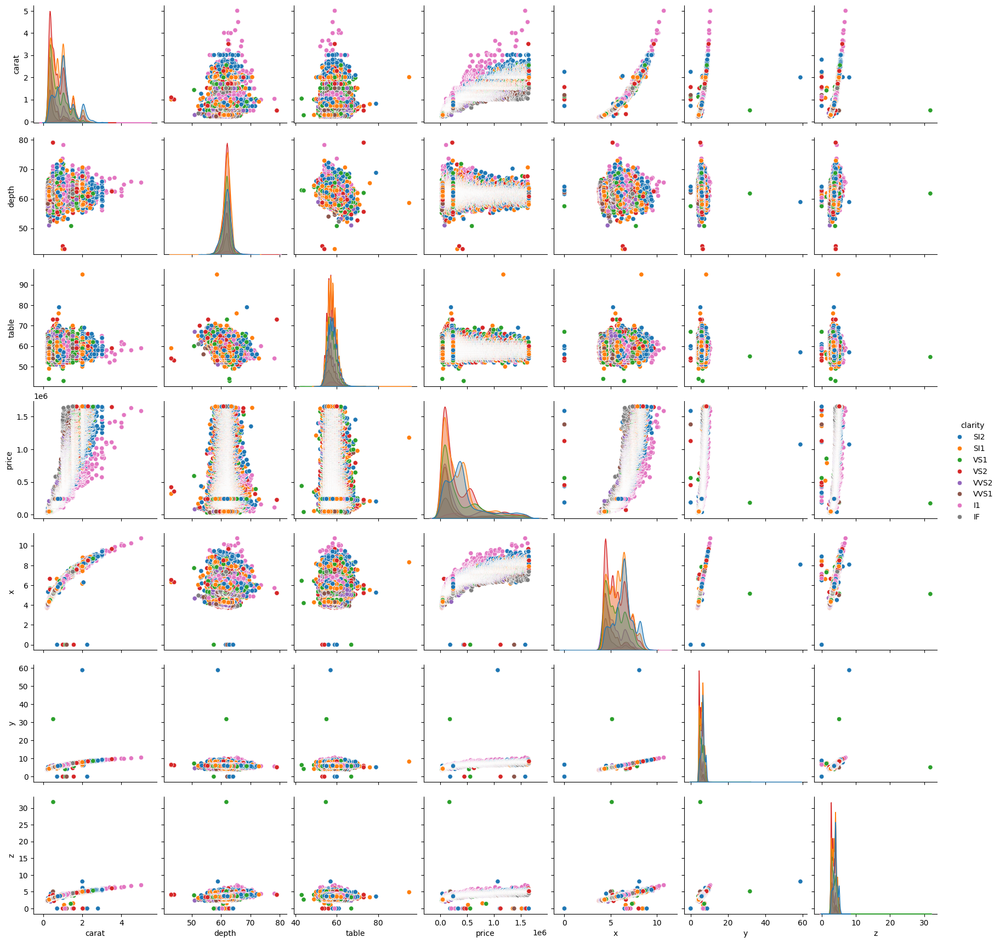

In [37]:
sns.pairplot(df, hue="clarity")

In [38]:
import plotly.graph_objects as go # Changed alias to 'go'

# Initial Plot: Scatter plot using 'price' for X and 'carat' for Y
plot = go.Figure(data=[
    go.Scatter( # Changed px.Scatter to go.Scatter
        x=df['price'], # Use your preferred column
        y=df['carat'], # Use your preferred column
        mode='markers',
        # Set a name for the trace, helpful for bar chart transition
        name='Data',
        marker=dict(color='midnightblue', 
            size=8,
            # FIX: Adding line properties often helps define the shape when switching to 'bar'
            line=dict(width=1, color='darkblue')
    )
    )
])

# Add dropdown
plot.update_layout(
    title_text='Dynamic Plot of Price vs. Carat',
    title_x=0.5,
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["type", "scatter"],
                    label="Scatter Plot (Price vs. Carat)",
                    method="restyle"
                ),
                dict(
                    # NOTE: A bar chart of Price vs Carat will likely look messy
                    # as it plots a bar for every row. This just demonstrates 
                    # the dropdown functionality changing the 'type'.
                    args=["type", "bar"],
                    label="Bar Chart (Price vs. Carat)",
                    method="restyle"
                )
            ]),
            direction="down",
            showactive=True,
        ),
    ]
)

plot.show()

In [39]:
import plotly.graph_objects as go 

# Initial Plot: Scatter plot using 'color' for X and 'clarity' for Y
plot = go.Figure(data=[
    go.Scatter(
        x=df['color'], 
        y=df['clarity'],
        mode='markers',
        name='Data',
        marker=dict(color='red', 
            size=8,
            # FIX: Adding line properties often helps define the shape when switching to 'bar'
            line=dict(width=1, color='red')
    )
    )
])

# Add dropdown
plot.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["type", "scatter"],
                    label="Scatter Plot (Color vs. Clarity)", 
                    method="restyle"
                ),
                dict(
                    # This will now clearly show bright blue bars
                    args=["type", "bar"],
                    label="Bar Chart (Color vs. Clarity)",
                    method="restyle"
                )
            ]),
            direction="down",
            showactive=True,
        ),
    ],
    title="Color vs. Clarity Plot with Dynamic Type Switch",
    xaxis_title="Color",
    yaxis_title="Clarity"
)

plot.show()

In [40]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [41]:
# Initial Plot: Scatter plot using 'color' for X and 'table' for Y
plot = go.Figure(data=[
    go.Scatter(
        x=df['carat'],    # <--- CHANGED TO 'color'
        y=df['table'],  # <--- CHANGED TO 'table'
        mode='markers',
        name='Data',
        marker=dict(color='blue', 
            size=8,
            # FIX: Adding line properties often helps define the shape when switching to 'bar'
            line=dict(width=1, color='blue')
        )      
    )
])

# Add dropdown
plot.update_layout(
    updatemenus=[
        dict(
            buttons=list([
                dict(
                    args=["type", "scatter"],
                    label="Scatter Plot (Color vs. table)", # <--- CHANGED LABEL
                    method="restyle"
                ),
                dict(
                    args=["type", "bar"],
                    label="Bar Chart (Color vs. table)",    # <--- CHANGED LABEL
                    method="restyle"
                )
            ]),
            direction="down",
            showactive=True,
        ),
    ],
    # Add titles for better context
    title="x vs. table Plot with Dynamic Type Switch",
    xaxis_title="carat",
    yaxis_title="table"
)

plot.show()

In [42]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [43]:
import plotly.express as px 
# ... (DataFrame setup/loading is the same as above) ...

# Alternative: Use a Box Plot for better visualization
fig_box = px.box(
    df, 
    x="cut", 
    y="table",
    title="Box Plot of Table Measurement by Cut Quality"
) 

fig_box.show()

In [44]:
import plotly.express as px 
# ... (DataFrame setup/loading is the same as above) ...

# Alternative: Use a Box Plot for better visualization
fig_box = px.box(
    df, 
    x="price", 
    y="color",
    title="Box Plot of Table Measurement by Cut Quality"
) 

fig_box.show()

In [45]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [46]:
import plotly.express as px 
# ... (DataFrame setup/loading is the same as above) ...

# Alternative: Use a Box Plot for better visualization
fig_box = px.box(
    df, 
    x="price",
    y="clarity",
    title="Box Plot of Table Measurement by Cut Quality"
) 

fig_box.show()

In [47]:
df['cut'].unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [48]:
import plotly.express as px
sizes = [15, 30, 25, 10,8] 
cut = ['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']


fig = px.pie(values=sizes, names=cut,title="Distribution of Diamond cut")
fig.show()


In [49]:
import plotly.express as px
sizes = [15, 30, 25, 10, 5, 8, 4] 
color = ['E', 'I', 'J', 'H', 'F', 'G', 'D']


fig = px.pie(values=sizes, names=color,title="Distribution of Diamond color")
fig.show()


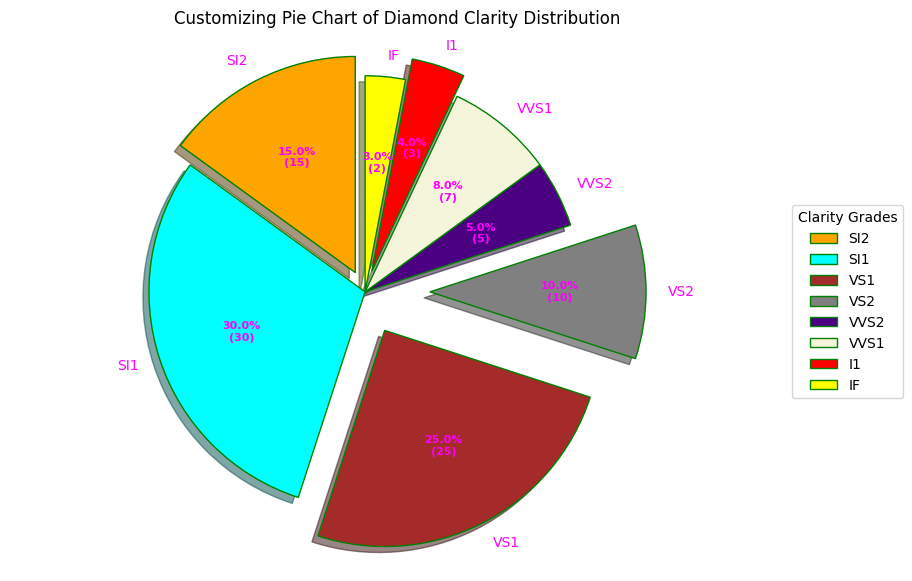

In [50]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt


# Creating dataset
clarity = ['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'] # 8 items

sizes = [15, 30, 25, 10, 5, 8, 4, 3] # 8 items


# Creating explode data
# FIX 1: Length corrected to 8 items to match clarity/sizes
explode = (0.1, 0.0, 0.2, 0.3, 0.0, 0.0, 0.1, 0.0) 

# Creating color parameters
colors = ("orange", "cyan", "brown",
          "grey", "indigo", "beige","red","yellow") # 8 items

# Wedge properties
wp = {'linewidth': 1, 'edgecolor': "green"}

# Creating autocpt arguments

# FIX 2: Replaced 'data' with a more generic variable name 'allvalues' 
# and changed 'g' to a generic count label or removed it entirely.
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    # Return percentage and absolute count
    return "{:.1f}%\n({:d})".format(pct, absolute)


# Creating plot
fig, ax = plt.subplots(figsize=(10, 7))
wedges, texts, autotexts = ax.pie(
    # FIX 3: Replaced undefined 'data' with the correct variable 'sizes'
    sizes,
    # FIX 4: Use 'sizes' instead of 'data' inside the lambda
    autopct=lambda pct: func(pct, sizes),
    explode=explode,
    labels=clarity,
    colors=colors, # Added colors argument
    shadow=True,
    # FIX 5: Removed invalid argument 'clarity=clarity'
    startangle=90,
    wedgeprops=wp,
    textprops=dict(color="magenta")
)

# Adding legend
ax.legend(wedges, clarity,
          title="Clarity Grades", # Changed title from 'Cars' to match data context
          loc="center left",
          bbox_to_anchor=(1, 0, 0.5, 1))

plt.setp(autotexts, size=8, weight="bold")
ax.set_title("Customizing Pie Chart of Diamond Clarity Distribution") # Updated title

# Ensure the plot is circular
ax.axis('equal')

# show plot
plt.show()

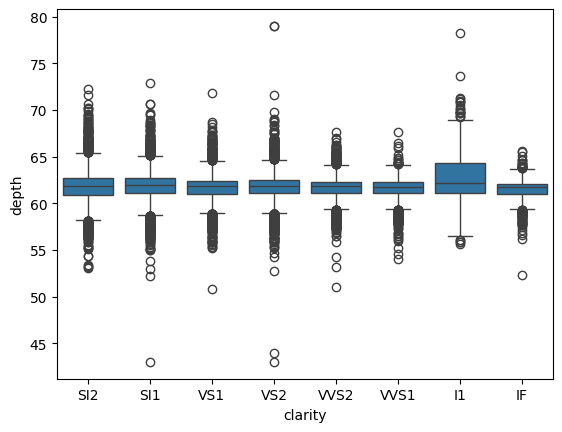

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x='clarity',y="depth",data=df)
plt.show()

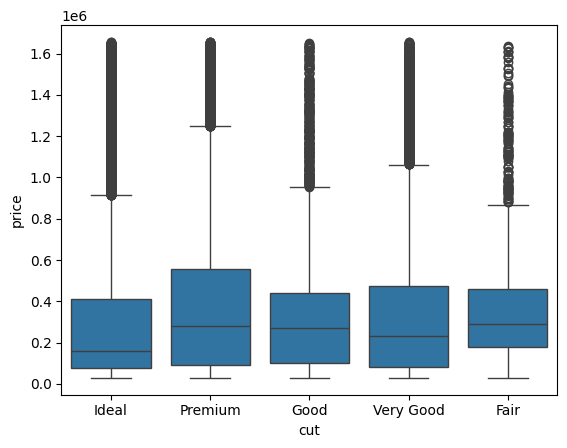

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x='cut',y="price",data=df)
plt.show()

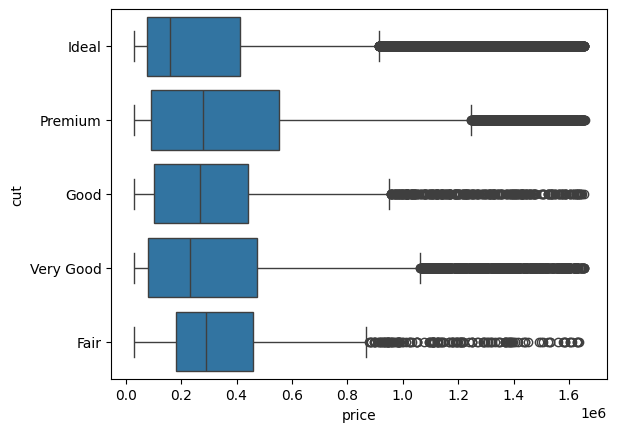

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.boxplot(x='price',y="cut",data=df)
plt.show()

In [54]:
df.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [55]:
import plotly.graph_objects as go
# Assuming df is loaded and includes 'price', 'depth', and 'color'

fig = go.Figure()

fig.add_trace(go.Scatter(
    # X-axis: price
    x=df.price,
    # Y-axis: depth
    y=df.depth,
    mode='markers',
    # Use 'color' to color-code the points
    marker=dict(
        color=df.color.astype('category').cat.codes, # Convert color to numeric code for marker color
        colorscale='Viridis',
        showscale=True
    ),
    name='Price vs. Depth by Color'
))

# -------------------------------------------------------------------
# 🌟 PLACE THE TITLE CODE HERE 🌟
fig.update_layout(
    title='Price vs. Depth Scatter Plot, Color-Coded by Diamond Color',
    xaxis_title='Price',
    yaxis_title='Depth'
)
# -------------------------------------------------------------------

fig.show()

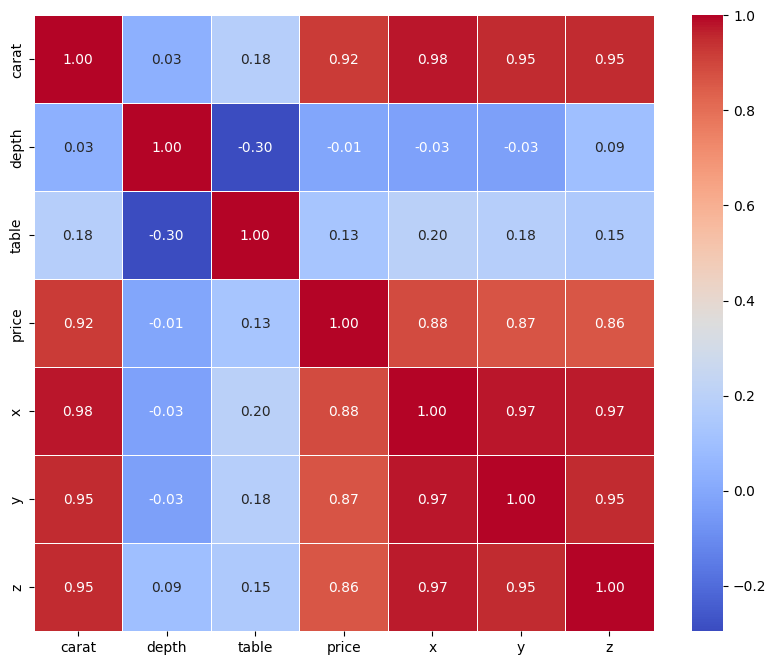

In [56]:
# Select only numerical columns for the correlation
numerical_df = df.select_dtypes(include=['number'])

# Calculate correlation on the new numerical DataFrame
corr_matrix = numerical_df.corr()

# Now plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.show()

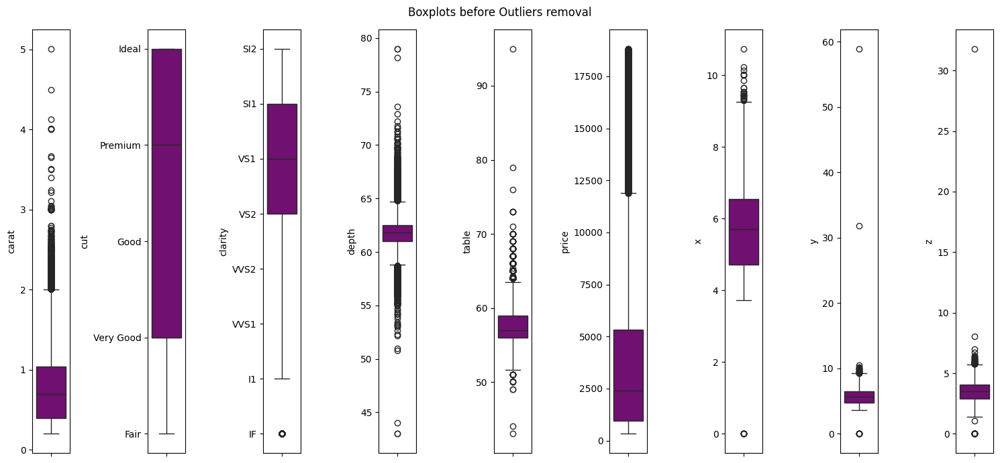

In [57]:
numerical_cols = ['carat','cut','clarity','depth','table','price','x','y','z']

# Loop through numerical columns and create boxplots

plt.figure(figsize=(15, 7))
plt.suptitle("Boxplots before Outliers removal")
for i in range(0, len(numerical_cols)):
    plt.subplot(1, 9, i+1)
    sns.boxplot(y=data[numerical_cols[i]],color='purple',)
    plt.tight_layout()

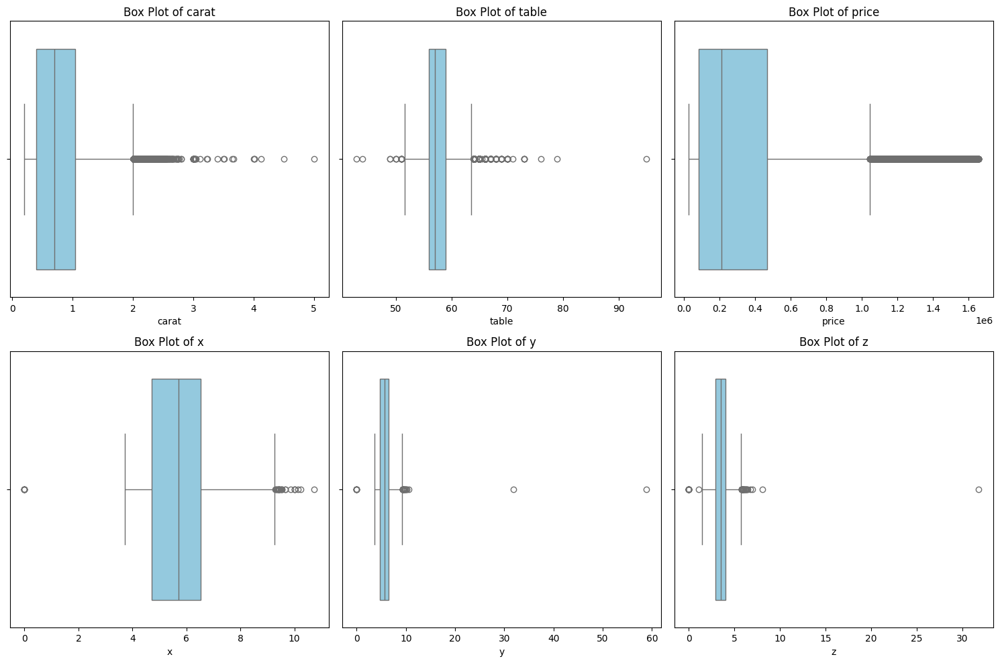

In [58]:
# List of continuous columns to plot
numerical_cols = ['carat','table','price','x','y','z']

# Set up the subplot grid
num_plots = len(numerical_cols)
num_cols = 3
num_rows = int(np.ceil(num_plots / num_cols))
plt.figure(figsize=(15, 5 * num_rows))

# Loop through each column and create a box plot
for i, col in enumerate(numerical_cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.tight_layout()

plt.show()

In [59]:
# List of continuous columns to clean
numerical_cols = ['carat','depth','table','price','x','y','z']
# Create a copy of the DataFrame to work with
df1 = df.copy()


# Loop through each continuous column
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out the outliers
    df= df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

print("Original data shape:", df.shape)
print("Data shape after removing outliers:", df.shape)

Original data shape: (46532, 10)
Data shape after removing outliers: (46532, 10)


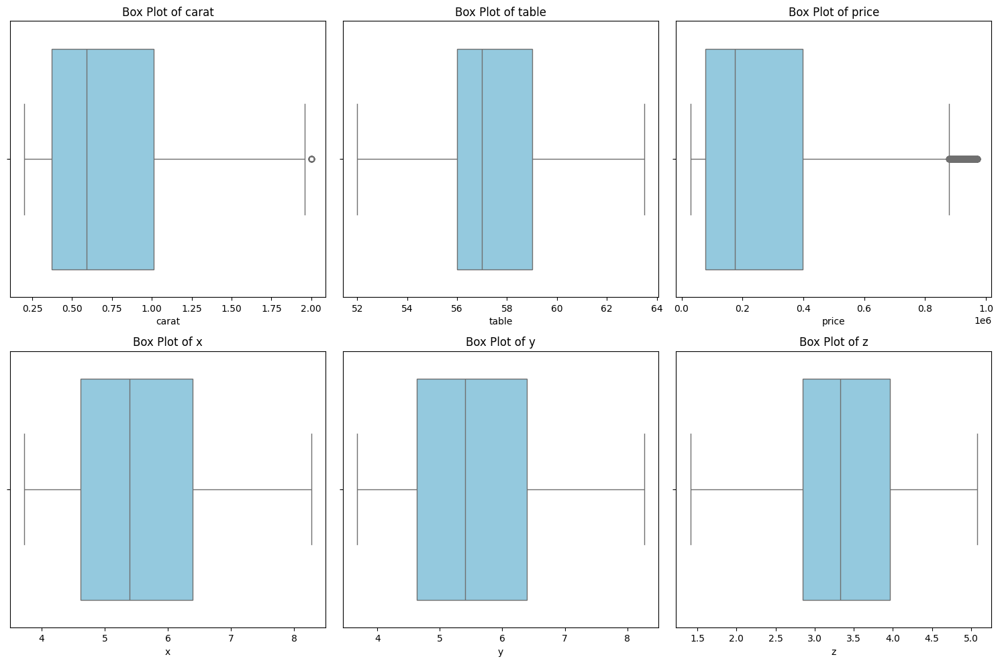

In [60]:
# List of continuous columns to plot
numerical_cols = ['carat','table','price','x','y','z']

# Set up the subplot grid
num_plots = len(numerical_cols)
num_cols = 3
num_rows = int(np.ceil(num_plots / num_cols))
plt.figure(figsize=(15, 5 * num_rows))

# Loop through each column and create a box plot
for i, col in enumerate(numerical_cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(x=df[col], color='skyblue')
    plt.title(f'Box Plot of {col}')
    plt.xlabel(col)
    plt.tight_layout()

plt.show()

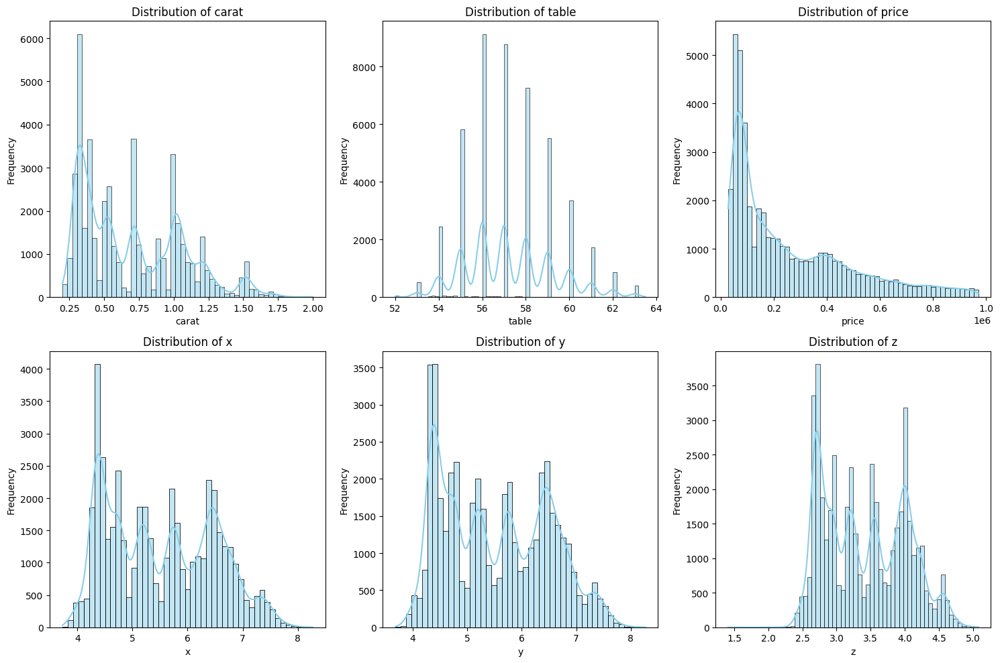

In [61]:
# List of continuous columns to plot

numerical_cols = ['carat','table','price','x','y','z']

# Set up the subplot grid
num_plots = len(numerical_cols)
num_cols = 3
num_rows = int(np.ceil(num_plots / num_cols))
plt.figure(figsize=(15, 5 * num_rows))

# Loop through each column and create a distribution plot
for i, col in enumerate(numerical_cols):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()

plt.show()

In [62]:
df 

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.50,55.00,28688,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.80,61.00,28688,3.89,3.84,2.31
3,0.29,Premium,I,VS2,62.40,58.00,29392,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.30,58.00,29480,4.34,4.35,2.75
5,0.24,Very Good,J,VVS2,62.80,57.00,29568,3.94,3.96,2.48
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.80,57.00,242616,5.75,5.76,3.50
53936,0.72,Good,D,SI1,63.10,55.00,242616,5.69,5.75,3.61
53937,0.70,Very Good,D,SI1,62.80,60.00,242616,5.66,5.68,3.56
53938,0.86,Premium,H,SI2,61.00,58.00,242616,6.15,6.12,3.74


In [63]:
from sklearn.preprocessing import LabelEncoder

# Apply Label Encoding to the features
le = LabelEncoder()
df['cut_encoded'] = le.fit_transform(df['cut'])
print(le.classes_)
df['color_encoded'] = le.fit_transform(df['color'])
print(le.classes_)
df['clarity_encoded'] = le.fit_transform(df['clarity'])
print(le.classes_)

# Drop the original categorical columns
#x = x.drop(['cut', 'color', 'clarity'], axis=1)

display(df)


['Fair' 'Good' 'Ideal' 'Premium' 'Very Good']
['D' 'E' 'F' 'G' 'H' 'I' 'J']
['I1' 'IF' 'SI1' 'SI2' 'VS1' 'VS2' 'VVS1' 'VVS2']


,carat,cut,color,clarity,depth,table,price,x,y,z,cut_encoded,color_encoded,clarity_encoded
0,0.23,Ideal,E,SI2,61.50,55.00,28688,3.95,3.98,2.43,2,1,3
1,0.21,Premium,E,SI1,59.80,61.00,28688,3.89,3.84,2.31,3,1,2
3,0.29,Premium,I,VS2,62.40,58.00,29392,4.20,4.23,2.63,3,5,5
4,0.31,Good,J,SI2,63.30,58.00,29480,4.34,4.35,2.75,1,6,3
5,0.24,Very Good,J,VVS2,62.80,57.00,29568,3.94,3.96,2.48,4,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
53935,0.72,Ideal,D,SI1,60.80,57.00,242616,5.75,5.76,3.50,2,0,2
53936,0.72,Good,D,SI1,63.10,55.00,242616,5.69,5.75,3.61,1,0,2
53937,0.70,Very Good,D,SI1,62.80,60.00,242616,5.66,5.68,3.56,4,0,2
53938,0.86,Premium,H,SI2,61.00,58.00,242616,6.15,6.12,3.74,3,4,3


In [64]:
x = df[['carat','x','y','color_encoded','clarity_encoded']]
y = df['price']

x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [65]:
print (y_test.shape)
print (x_test.shape)

(9307,)
(9307, 5)


Feature Importances:
carat             0.56
y                 0.29
clarity_encoded   0.07
x                 0.05
color_encoded     0.04
dtype: float64


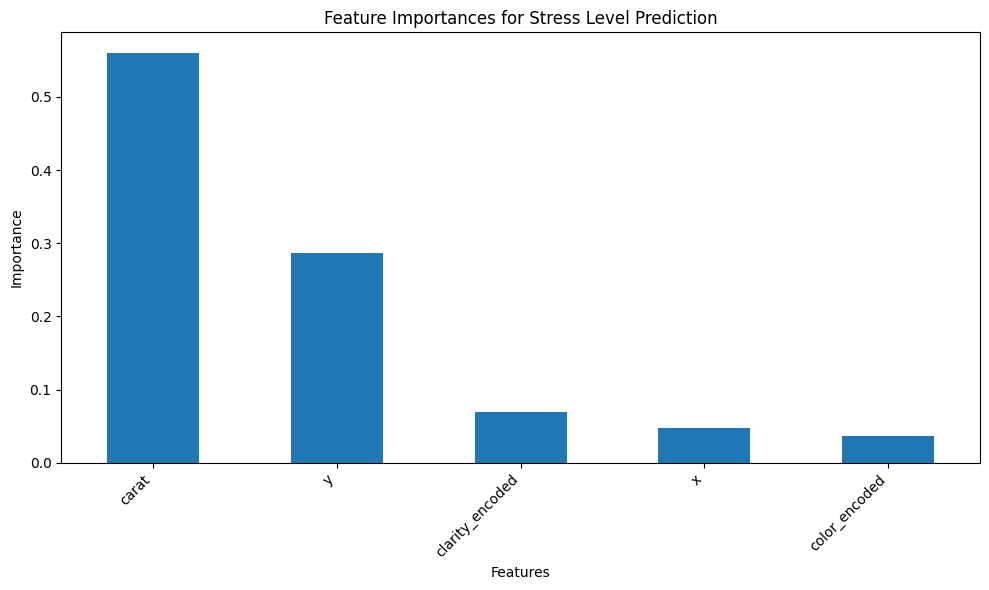

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor

# Train a Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(x_train, y_train)

# Get feature importances from the trained Random Forest model
feature_importances = pd.Series(rf_model.feature_importances_, index=x_train.columns)

# Sort feature importances in descending order
feature_importances = feature_importances.sort_values(ascending=False)

# Print feature importances
print("Feature Importances:")
print(feature_importances)

# Plot feature importances
plt.figure(figsize=(10, 6))
feature_importances.plot(kind='bar')
plt.title('Feature Importances for Stress Level Prediction')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [67]:
from sklearn.preprocessing import StandardScaler

# Initialize the scalers
scaler_x = StandardScaler()

# 1. Scale the features (x)
x_scaled = scaler_x.fit_transform(x)
x = pd.DataFrame(x_scaled, columns=x.columns)


In [68]:
x

,carat,x,y,color_encoded,clarity_encoded
0,-1.29,-1.63,-1.61,-0.91,-0.51
1,-1.35,-1.69,-1.76,-0.91,-1.09
2,-1.13,-1.37,-1.35,1.46,0.64
3,-1.07,-1.22,-1.23,2.06,-0.51
4,-1.27,-1.64,-1.63,2.06,1.80
...,...,...,...,...,...
46527,0.06,0.24,0.24,-1.50,-1.09
46528,0.06,0.17,0.23,-1.50,-1.09
46529,0.01,0.14,0.16,-1.50,-1.09
46530,0.45,0.65,0.62,0.87,-0.51


In [69]:
y

0         28688
1         28688
3         29392
4         29480
5         29568
          ...  
53935    242616
53936    242616
53937    242616
53938    242616
53939    242616
Name: price, Length: 46532, dtype: int64

In [70]:
from lazypredict.Supervised import LazyRegressor
from sklearn import datasets
from sklearn.utils import shuffle

In [71]:
x_train, x_test, y_train, y_test = train_test_split(
    x, 
    y, 
    test_size=0.2, 
    random_state=42 # Set for reproducibility
)

In [72]:
from lazypredict.Supervised import LazyRegressor
# Assuming your scaled and split variables are already in memory: 
# x_train, x_test, y_train, y_test

reg = LazyRegressor(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = reg.fit(x_train, x_test, y_train, y_test)
display(models)

  0%|          | 0/42 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 695
[LightGBM] [Info] Number of data points in the train set: 37225, number of used features: 5
[LightGBM] [Info] Start training from score 264299.528596


,Adjusted R-Squared,R-Squared,RMSE,Time Taken
Model,,,,
HistGradientBoostingRegressor,0.98,0.98,31382.10,0.81
LGBMRegressor,0.98,0.98,31445.92,0.29
XGBRegressor,0.98,0.98,31536.15,0.33
RandomForestRegressor,0.98,0.98,32994.03,12.78
KNeighborsRegressor,0.98,0.98,33482.81,0.24
BaggingRegressor,0.98,0.98,34270.33,1.43
ExtraTreesRegressor,0.98,0.98,34453.83,9.45
GradientBoostingRegressor,0.97,0.97,37215.12,3.85
DecisionTreeRegressor,0.96,0.96,43959.16,0.20


In [73]:
x_test 

,carat,x,y,color_encoded,clarity_encoded
3288,0.56,0.66,0.56,1.46,0.64
24569,-1.02,-1.09,-1.07,-0.91,0.64
3227,0.12,0.16,0.24,-0.91,0.07
33023,-0.55,-0.51,-0.47,-0.91,-0.51
41611,0.03,0.21,0.16,-0.91,-0.51
...,...,...,...,...,...
32582,-0.85,-0.90,-0.96,-0.32,0.64
20813,2.77,2.26,2.23,1.46,0.64
35816,-0.80,-0.80,-0.77,-0.32,-1.67
27403,-1.02,-1.08,-1.04,-0.91,-0.51


In [74]:
y_test

3627     301928
30713     64944
3555     300608
39451     94776
48559    175208
          ...  
38984     92664
22609    938256
42428    115544
33627     40744
11705     52448
Name: price, Length: 9307, dtype: int64

In [75]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()

In [76]:
model.fit(x_train,y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [77]:
print(model.coef_)

[ 299435.87819856 -176409.93779627  101625.39997749  -26699.43165117
   31752.66896824]


In [78]:
print(model.intercept_)

264256.03669771267


In [79]:
x

,carat,x,y,color_encoded,clarity_encoded
0,-1.29,-1.63,-1.61,-0.91,-0.51
1,-1.35,-1.69,-1.76,-0.91,-1.09
2,-1.13,-1.37,-1.35,1.46,0.64
3,-1.07,-1.22,-1.23,2.06,-0.51
4,-1.27,-1.64,-1.63,2.06,1.80
...,...,...,...,...,...
46527,0.06,0.24,0.24,-1.50,-1.09
46528,0.06,0.17,0.23,-1.50,-1.09
46529,0.01,0.14,0.16,-1.50,-1.09
46530,0.45,0.65,0.62,0.87,-0.51


In [80]:
y_pred =model.predict(x_test)

In [81]:
from sklearn.metrics import r2_score

r2_score(y_test, y_pred)

0.8899248785089994

In [82]:
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error

mean_absolute_error(y_test,y_pred)

51267.59297956972

In [83]:
mean_absolute_percentage_error(y_test,y_pred)

0.2907690950536727

In [84]:
mean_squared_error(y_test,y_pred)

5741116278.188681

### Decision Tree ### 


In [85]:
from sklearn.tree import DecisionTreeRegressor

regr_1 = DecisionTreeRegressor(max_depth=2, random_state=42)
regr_1.fit(x_train, y_train) 

regr_2 = DecisionTreeRegressor(max_depth=5, random_state=42)
regr_2.fit(x_train, y_train)


y_pred_dt = regr_2.predict(x_test) # ⬅️ Single prediction array for evaluation

mse = mean_squared_error(y_test, y_pred_dt)
r2 = r2_score(y_test, y_pred_dt)


single_data = x_test.iloc[[0]].values.reshape(1, -1)
predicted_value = regr_2.predict(single_data)
actual_value = y_test.iloc[0]


print("--- Decision Tree Regression Results (max_depth=5) ---")
print(f"Predicted Value (Single Sample): {predicted_value[0]:.2f}")
print(f"Actual Value (Single Sample): {actual_value:.2f}")

print(f"\nMean Squared Error (MSE): {mse:.2f}")
print(f"R-squared Score (R2): {r2:.2f}")

--- Decision Tree Regression Results (max_depth=5) ---
Predicted Value (Single Sample): 361412.69
Actual Value (Single Sample): 301928.00

Mean Squared Error (MSE): 3489255650.35
R-squared Score (R2): 0.93


##### RandomForestRegressor  ####

In [86]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

rf_regressor.fit(x_train, y_train)

y_pred = rf_regressor.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

single_data = x_test.iloc[0].values.reshape(1, -1)
predicted_value = rf_regressor.predict(single_data)
print(f"Predicted Value: {predicted_value[0]:.2f}")
print(f"Actual Value: {y_test.iloc[0]:.2f}")

print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared Score: {r2:.2f}")

Predicted Value: 280372.69
Actual Value: 301928.00
Mean Squared Error: 1089885413.88
R-squared Score: 0.98


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression


reg_model = LinearRegression() 




scores_mse = cross_val_score(
    reg_model, 
    x,             
    y,             
    cv=5, 
    scoring='neg_mean_squared_error',
    n_jobs=-1
)


scores_r2 = cross_val_score(
    reg_model, 
    x,             
    y,             
    cv=5, 
    scoring='r2',
    n_jobs=-1
)

print("--- K-Fold Cross-Validation Results (k=5) ---")
print(f"Individual Negative MSE Scores: {scores_mse}")
print(f"Individual R2 Scores: {scores_r2}")


print("\nFinal Metrics:")

print(f"Average Actual MSE: {-scores_mse.mean():.4f}") 
print(f"Average R2 Score: {scores_r2.mean():.4f}")

--- K-Fold Cross-Validation Results (k=5) ---
Individual Negative MSE Scores: [-6.62471526e+09 -1.13851694e+10 -1.46579661e+10 -2.88090230e+09
 -3.10227233e+09]
Individual R2 Scores: [ 0.36473715  0.64079859  0.87699901 -5.14940147 -0.18755332]

Final Metrics:
Average Actual MSE: 7730205081.8019
Average R2 Score: -0.6909


In [88]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, make_scorer
import numpy as np

# 1. Define the Parameter Search Space
# Define the ranges/values for the hyper-parameters to test
param_dist = {
    'n_estimators': [100, 200, 500, 1000],  # Number of trees
    'max_depth': [10, 20, 30, None],        # Max depth of trees
    'min_samples_split': [2, 5, 10],        # Min samples to split a node
    'min_samples_leaf': [1, 2, 4],          # Min samples in a leaf node
    'max_features': ['sqrt', 'log2', 0.5, 0.8] # Number of features to consider
}

# 2. Initialize the Base Model
rf = RandomForestRegressor(random_state=42)

# 3. Define the Scorer (Negative MSE, as we want to minimize the error)
# 'neg_mean_squared_error' is used because RandomizedSearchCV maximizes the score.
scorer = make_scorer(mean_squared_error, greater_is_better=False)

# 4. Initialize and Execute Randomized Search
# n_iter=50 tests 50 different random combinations
# cv=5 uses 5-fold Cross-Validation
print("Starting Hyperparameter Tuning...")
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=50,
    scoring=scorer,
    cv=5,
    verbose=2,
    random_state=42,
    n_jobs=-1 # Use all available cores
)

# Fit the search to your training data
# This is where the actual tuning happens.
random_search.fit(x_train, y_train) 

# 5. Retrieve the Best Model and Parameters
best_params = random_search.best_params_
best_score = random_search.best_score_
best_rf_regressor = random_search.best_estimator_

print("\n--- Optimized Model Results ---")
print(f"Best Hyperparameters Found: {best_params}")
print(f"Best CV Mean Squared Error: {-best_score:.4f}") 

# 6. Evaluate the Tuned Model on the Test Data
y_pred_tuned = best_rf_regressor.predict(x_test)
mse_tuned = mean_squared_error(y_test, y_pred_tuned)
r2_tuned = r2_score(y_test, y_pred_tuned)

print(f"\nFinal Test MSE (Tuned Model): {mse_tuned:.4f}")
print(f"Final Test R-squared (Tuned Model): {r2_tuned:.4f}")

Starting Hyperparameter Tuning...
Fitting 5 folds for each of 50 candidates, totalling 250 fits

--- Optimized Model Results ---
Best Hyperparameters Found: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 0.8, 'max_depth': 30}
Best CV Mean Squared Error: 1017711750.0069

Final Test MSE (Tuned Model): 1004067769.6625
Final Test R-squared (Tuned Model): 0.9807


#### ANN MODEL ###

In [89]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [90]:
!pip install tensorflow


[notice] A new release of pip is available: 25.1.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [91]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd # Needed if x_test is a DataFrame

# --- 1. ANN Model Definition ---
# The model is built for regression (predicting a continuous price).
# We use x_train.shape[1] to dynamically get the number of input features.
# Note: x_train must be a NumPy array or TensorFlow Tensor for direct input, 
# but Keras handles DataFrames gracefully for simple models.

model = Sequential([
    # Input Layer (Implicit) and First Hidden Layer
    # Uses 64 neurons and 'relu' activation (common for hidden layers)
    Dense(64, activation='relu', input_shape=(x_train.shape[1],)), 
    
    # Second Hidden Layer
    Dense(32, activation='relu'),
    
    # Output Layer for Regression
    # Uses 1 neuron and 'linear' activation (or no activation) to output the continuous price.
    Dense(1, activation='linear') 
])

# --- 2. Compile the Model ---
# Optimizer: Adam is the most common default choice.
# Loss: 'mse' (Mean Squared Error) is the standard loss function for regression.
# Metrics: We monitor 'mae' (Mean Absolute Error) during training.
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])


# --- 3. Train the Model ---
# epochs=100 is a starting point; batch_size=32 is standard.
# validation_split=0.2 reserves 20% of the training data for validation during training.
print("Starting ANN Model Training...")
history = model.fit(
    x_train, 
    y_train, 
    epochs=100, 
    batch_size=32, 
    verbose=1,
    validation_split=0.2 
)
print("Training Complete.")


# --- 4. Evaluate the Model on Test Data ---
print("\n--- Model Evaluation on Test Data ---")

# Predict on the scaled test features (x_test)
y_pred_ann = model.predict(x_test)

# Since y_test is UNSEALED, the predictions (y_pred_ann) are the actual prices.

# Calculate the final metrics
mse_ann = mean_squared_error(y_test, y_pred_ann)
r2_ann = r2_score(y_test, y_pred_ann)


# --- 5. Output Results ---
print(f"Test Set Mean Squared Error (MSE): {mse_ann:.4f}")
print(f"Test Set R-squared Score (R2): {r2_ann:.4f}")

# Predict a single example (first test sample)
single_data = x_test.iloc[[0]].values
predicted_price = model.predict(single_data)

print(f"\nExample Prediction:")
print(f"Input Features (Scaled): {single_data.flatten()}")
print(f"Predicted Price: {predicted_price[0][0]:,.2f}")
print(f"Actual Price: {y_test.iloc[0]:,.2f}")

Starting ANN Model Training...
Epoch 1/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - loss: 119315906560.0000 - mae: 260778.2031 - val_loss: 114823471104.0000 - val_mae: 255160.8125
Epoch 2/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 93854670848.0000 - mae: 227016.8438 - val_loss: 71033241600.0000 - val_mae: 193992.3281
Epoch 3/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 45863100416.0000 - mae: 148950.0938 - val_loss: 25185435648.0000 - val_mae: 106159.5312
Epoch 4/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 15785744384.0000 - mae: 83194.6719 - val_loss: 10189250560.0000 - val_mae: 68278.1094
Epoch 5/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 8406677504.0000 - mae: 63267.4570 - val_loss: 7350596096.0000 - val_mae: 59513.2773
Epoch 6/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 6480518656.0000 - mae: 56383.4062 - val_loss: 6107494400.0000 - val_mae: 54596.4180
Epoch 7/100
931/931 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 5598353408.0000 - mae:

In [92]:
import os

model_filename = 'ann_diamond_price_model.keras'
model.save(model_filename)

In [93]:
import tensorflow as tf
from tensorflow.keras.models import load_model

loaded_model = load_model(model_filename)


In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

PCA

Shape of PCA result (X_pca): (46532, 2)

First 5 rows of X_pca:
[[-3.22686489 -0.58140132]
 [-2.98771558  2.66983381]
 [-2.30347718  0.2150846 ]
 [-1.87868718 -1.56795171]
 [-2.84141819  0.33060752]]


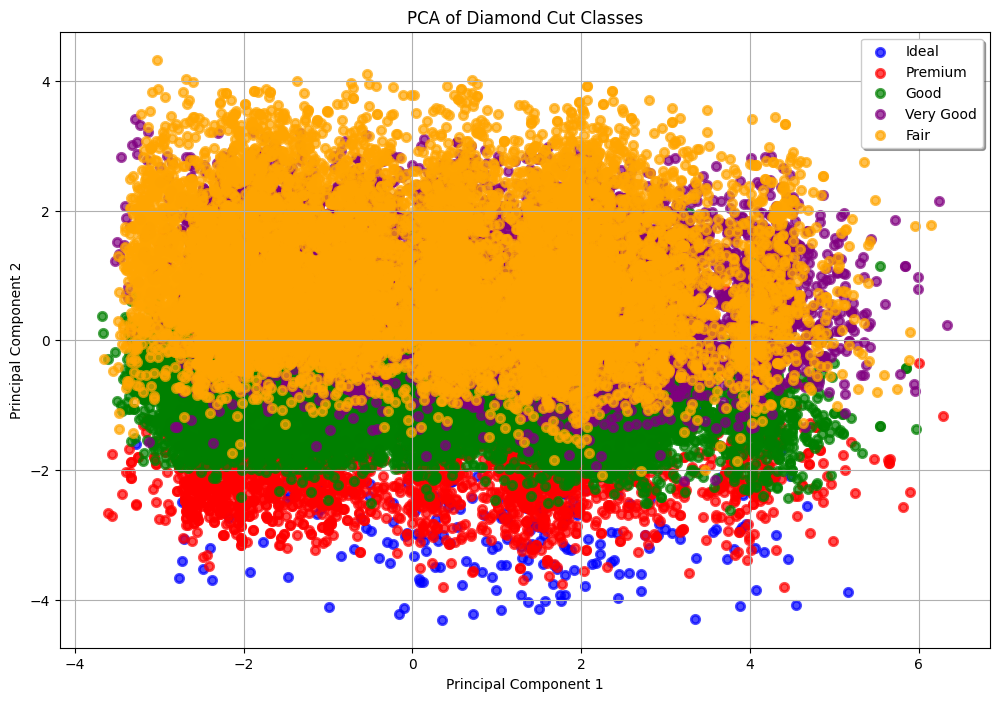

In [109]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Assuming 'df' is your loaded and pre-processed diamond DataFrame
# You must ensure 'df', 'carat', 'color_encoded', etc., are defined before this code runs.

# 1. Define Features (X) and Target (y)
x1 = df[['carat', 'color_encoded', 'clarity_encoded', 'cut_encoded', 'depth', 'table', 'x', 'y', 'z']]
y2 = df['cut']

# We need a list of the unique cut names and corresponding integer targets for plotting
# Assuming 'cut' has been encoded such that:
# 0: Ideal, 1: Premium, 2: Good, 3: Very Good, 4: Fair
# If 'y2' is the raw categorical column 'cut', you must encode it first.
# If 'y2' is already encoded (e.g., as 'cut_encoded'), use that.
# For simplicity and to match the plot structure, we'll assume a numerical target 'y_target'.

# Mapping the original 'cut' categories to a numerical target array 'y_target'
# Ensure you have a numerically encoded target array for plotting (e.g., 0, 1, 2, 3, 4)
# If y2 is the raw string column, convert it to numerical labels.
# ---
# Placeholder for numerical target array y_target based on your earlier discussion:
# Assuming y_target is a numerical array (0, 1, 2, 3, 4) corresponding to the cuts.
# If 'cut_encoded' is not in x1, we can use it as our y_target:
y_target = df['cut_encoded'] 
# ---

target_names = ['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']

# 2. Standardize the features (CRITICAL step for PCA)
scaler = StandardScaler()
X_std = scaler.fit_transform(x1)

# 3. Apply PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

# Display the first few principal components
print("Shape of PCA result (X_pca):", X_pca.shape)
print("\nFirst 5 rows of X_pca:")
print(X_pca[:5])

# 4. Plot the PCA result
plt.figure(figsize=(12, 8))

# Define colors and targets to match the 5 classes
colors = ['blue', 'red', 'green', 'purple', 'orange'] 
targets = [0, 1, 2, 3, 4] 
lw = 2

for color, i, target_name in zip(colors, targets, target_names):
    # Use the numerically encoded target array (y_target) for indexing
    plt.scatter(X_pca[y_target == i, 0], X_pca[y_target == i, 1], 
                color=color, 
                alpha=0.7, 
                lw=lw, 
                label=target_name)

plt.legend(loc='best', shadow=True, scatterpoints=1)
plt.title('PCA of Diamond Cut Classes')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()

3D

In [110]:
import plotly.offline as py
import plotly.graph_objs as go
import pandas as pd
# Assuming df is your DataFrame

# Define the features to use for the 3 axes
X_AXIS = 'carat'
Y_AXIS = 'depth'
Z_AXIS = 'table'
COLOR_VAR = 'cut_encoded' # Use the numerical encoding for coloring

# --- Create the 3D Scatter Trace ---
trace_diamond = go.Scatter3d(
    # Select three continuous features for the axes
    x=df[X_AXIS],
    y=df[Y_AXIS],
    z=df[Z_AXIS],
    mode='markers',
    marker=dict(
        # Use the encoded cut as the color variable
        color=df[COLOR_VAR], 
        colorscale='Viridis', # Use a color scale suitable for numerical data
        size=3,               # Smaller size is usually better for large datasets
        line=dict(
            color='rgba(0, 0, 0, 0.1)', # Light border around markers
            width=0.5
        ),
        opacity=0.8
    )
)

data = [trace_diamond]

# --- Define the Layout ---
layout = go.Layout(
    title='3D Distribution of Diamond Features by Cut',
    scene=dict(
        xaxis=dict(title=X_AXIS.replace('_', ' ').title()),
        yaxis=dict(title=Y_AXIS.replace('_', ' ').title()),
        zaxis=dict(title=Z_AXIS.replace('_', ' ').title()),
    )
)

# --- Create and Display the Figure ---
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

UNSUPERVISED LEARNING 

K - MEAN 

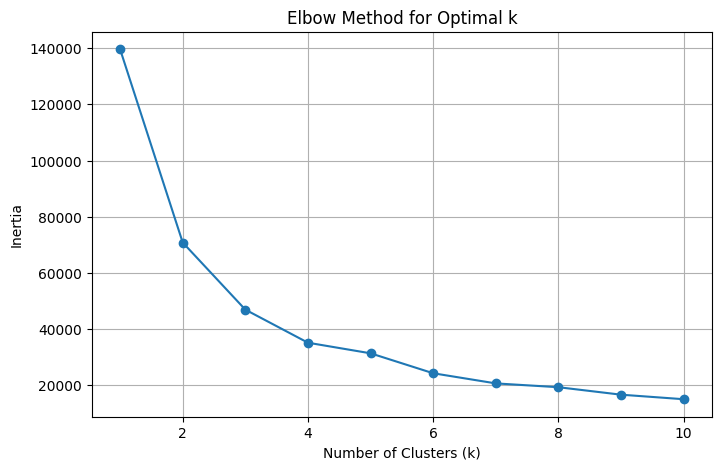

--- Cluster Averages (Price and Carat) ---
            price  carat
Cluster                 
0       543873.14   1.13
1       124175.00   0.46
2       525605.25   1.14
3       126712.84   0.49
4       120055.60   0.47

--- Cut Distribution by Cluster ---
cut      Fair  Good  Ideal  Premium  Very Good
Cluster                                       
0        2.30 23.80  73.90     0.00       0.00
1        0.60 11.90  87.50     0.00       0.00
2        0.00  0.00   0.00    55.50      44.50
3        0.00  0.00   0.00     0.00     100.00
4        0.00  0.00   0.00   100.00       0.00

Clusters have been named and added to the DataFrame ('Cluster_Name' column).


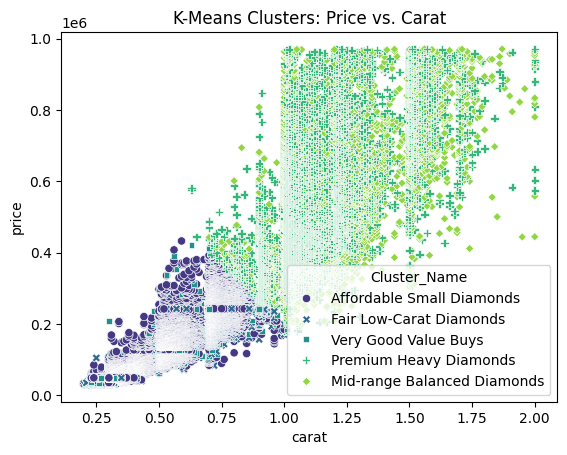

In [116]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is your loaded DataFrame containing all diamond data
# and 'cut_encoded' is the numerical version of the 'cut' column.

# --- 1. Data Preparation ---

# Features for clustering (using price, carat, and cut_encoded)
clustering_features = ['carat', 'price', 'cut_encoded'] 
X_cluster = df[clustering_features]

# Standardize the features (CRITICAL for K-Means)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)
X_scaled_df = pd.DataFrame(X_scaled, columns=clustering_features, index=df.index)

# --- 2. Determine Optimal k (Elbow Method) ---

# Find inertia for different k values (e.g., k=1 to 10)
inertia = []
K_range = range(1, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init='auto')
    kmeans.fit(X_scaled_df)
    inertia.append(kmeans.inertia_)

# Plot the Elbow Method result
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertia, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()
# Based on the elbow plot, you would visually choose the optimal k. 
# For demonstration, let's assume k=5 based on the common diamond cut classes.

# --- 3. Apply K-Means with Chosen k ---

# Set the optimal k (replace 5 with your chosen value from the Elbow plot)
optimal_k = 5 
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
df['Cluster'] = kmeans_final.fit_predict(X_scaled_df) 

# --- 4. Analyze and Name Clusters ---

# Calculate the mean of the original, unscaled features per cluster
cluster_analysis = df.groupby('Cluster')[['price', 'carat']].mean()

# Calculate the cut distribution (mode or count/percentage)
cut_distribution = df.groupby('Cluster')['cut'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()

print("--- Cluster Averages (Price and Carat) ---")
print(cluster_analysis.round(2))
print("\n--- Cut Distribution by Cluster ---")
# Pivot the cut distribution for a cleaner look
cut_pivot = cut_distribution.pivot(index='Cluster', columns='cut', values='Percentage').fillna(0).round(1)
print(cut_pivot)

# --- Naming Clusters (Based on Example Output) ---
# The actual names will depend on the output of the analysis above!

# Example Interpretation based on hypothetical results:
# Cluster 0: High average price, high average carat, high percentage of 'Ideal' cut.
# Cluster 1: Low average price, low average carat, high percentage of 'Fair' cut.

cluster_names = {
    # Replace these names based on the actual results of your analysis:
    0: "Premium Heavy Diamonds", 
    1: "Affordable Small Diamonds",
    2: "Mid-range Balanced Diamonds",
    3: "Very Good Value Buys",
    4: "Fair Low-Carat Diamonds"
}

# Apply the names to the DataFrame
df['Cluster_Name'] = df['Cluster'].map(cluster_names)

print("\nClusters have been named and added to the DataFrame ('Cluster_Name' column).")

# Optional: Visualize the clusters
sns.scatterplot(x='carat', y='price', hue='Cluster_Name', data=df, palette='viridis', style='Cluster_Name')
plt.title('K-Means Clusters: Price vs. Carat')
plt.show()

DBSCAN

In [117]:
import pandas as pd
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming 'df' is your loaded DataFrame containing all diamond data
# and 'price' and 'cut_encoded' columns are available.

# --- 1. Data Preparation ---

# Features for clustering (using price, carat, and cut_encoded)
clustering_features = ['carat', 'price', 'cut_encoded'] 
X_cluster = df[clustering_features]

# Standardize the features (CRITICAL for DBSCAN)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)
X_scaled_df = pd.DataFrame(X_scaled, columns=clustering_features, index=df.index)

# --- 2. Apply DBSCAN ---

# NOTE: DBSCAN requires tuning 'eps' (epsilon/radius) and 'min_samples'.
# You should typically use a k-distance plot (not shown here) to find a good 'eps'.
# The 'min_samples' is often set to twice the number of features (2 * 3 = 6).

# Placeholder parameters (You should tune these for optimal results)
epsilon = 0.5 
min_samples = 6

dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)

# Fit the model and get the cluster labels
df['Cluster'] = dbscan.fit_predict(X_scaled_df) 

# Clusters are labeled 0, 1, 2, ...
# Noise/Outliers are labeled with -1.

print(f"DBSCAN Clusters found (including noise -1): {np.unique(df['Cluster'])}")

# --- 3. Analyze and Name Clusters ---

# Filter out the noise points (-1) for meaningful cluster analysis
clustered_df = df[df['Cluster'] != -1].copy()

# Calculate the mean of the original, unscaled features per cluster
cluster_analysis = clustered_df.groupby('Cluster')[['price', 'carat']].mean()

# Calculate the cut distribution (percentage)
cut_distribution = clustered_df.groupby('Cluster')['cut'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()

print("\n--- Cluster Averages (Price and Carat, excluding noise) ---")
print(cluster_analysis.round(2))
print("\n--- Cut Distribution by Cluster (excluding noise) ---")
# Pivot the cut distribution for a cleaner look
cut_pivot = cut_distribution.pivot(index='Cluster', columns='cut', values='Percentage').fillna(0).round(1)
print(cut_pivot)

# --- Naming Clusters (Based on Example Output) ---
# The actual names will depend on the output of the analysis above!

# Example Interpretation based on hypothetical DBSCAN results:
# Cluster 0: Low average price, average carat, dominated by 'Very Good' cut.
# Cluster 1: High average price, highest average carat, mixed high-end cuts.

cluster_names = {
    # Replace these names based on the actual results of your analysis:
    0: "Standard Value Buys", 
    1: "Luxury Heavy Diamonds",
    2: "Compact Premium Pieces",
    # Add more mappings if DBSCAN found more clusters (3, 4, etc.)
}

# Apply the names to the DataFrame
df['Cluster_Name'] = df['Cluster'].map(cluster_names).fillna('Noise/Outlier (-1)')

print("\nClusters have been named and added to the DataFrame ('Cluster_Name' column).")

# Display the count of points in each final cluster
print("\nFinal Cluster Sizes:")
print(df['Cluster_Name'].value_counts())

DBSCAN Clusters found (including noise -1): [-1  0  1  2  3  4]

--- Cluster Averages (Price and Carat, excluding noise) ---
            price  carat
Cluster                 
0       237413.16   0.63
1       293617.97   0.76
2       276553.95   0.76
3       275102.70   0.72
4       313111.39   0.91

--- Cut Distribution by Cluster (excluding noise) ---
cut       Fair   Good  Ideal  Premium  Very Good
Cluster                                         
0         0.00   0.00 100.00     0.00       0.00
1         0.00   0.00   0.00   100.00       0.00
2         0.00 100.00   0.00     0.00       0.00
3         0.00   0.00   0.00     0.00     100.00
4       100.00   0.00   0.00     0.00       0.00

Clusters have been named and added to the DataFrame ('Cluster_Name' column).

Final Cluster Sizes:
Cluster_Name
Standard Value Buys       20095
Luxury Heavy Diamonds     11746
Noise/Outlier (-1)        11016
Compact Premium Pieces     3675
Name: count, dtype: int64


UNSUPERVISE CLUSTERING PRICE PREDICTION 

In [124]:
import pickle

filename = 'kmeans_diamond_model.pkl'

with open(filename, 'wb') as file:
    pickle.dump(kmeans_final, file)

with open('kmeans_diamond_model.pkl', 'rb') as f:
    load_model = pickle.load(f)


In [141]:
cluster_names = {
    0: "Premium Heavy Diamonds", 
    1: "Affordable Small Diamonds",
    2: "Mid-range Balanced Diamonds",
    3: "Very Good Value Buys",
    4: "Fair Low-Carat Diamonds"
}

EXPECTED_FEATURES = ['carat', 'price', 'cut_encoded'] 

x_new = pd.DataFrame({'carat': [0.1], 'price': [-10], 'cut_encoded': [-0.2]})

x_ordered = x_new[EXPECTED_FEATURES]

numeric_prediction = load_model.predict(x_ordered) 


cluster_id = numeric_prediction[0]

cluster_name = cluster_names[cluster_id]

print(f"The diamond belongs to the cluster: \"{cluster_name}\"")

The diamond belongs to the cluster: "Fair Low-Carat Diamonds"


ANN LOADED PRICE PREDICTION 

In [ ]:
x_test= pd.DataFrame({'carat':[8],'x':[3],'y':[0],'color_encoded':[8],'clarity_encoded':[0]})

y_pred_loaded = loaded_model.predict(x_test)
y_pred_loaded